# Breats Cancer Detection

Binomial Classification using LogisticRegression, based on Winsconsin data from [Kaggle](https://www.kaggle.com/datasets/uciml/breast-cancer-wisconsin-data)

By: Adriana Villalobos

In [ ]:
import pandas as pd
from funpymodeling.exploratory import status
import numpy as np

In [27]:
# Dataframe import
df = pd.read_csv('data/data_breast-cancer-wisconsin-data.csv', sep=',', encoding='utf-8')

In [28]:
pd.set_option('display.max_columns', None)

## 1. EDA

In [29]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [30]:
df.shape

(569, 33)

In [31]:
df = df.drop(columns=['id', 'Unnamed: 32'])
df = df.drop_duplicates()
df.shape

(569, 31)

In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    object 
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

In [33]:
df.diagnosis.value_counts()

diagnosis
B    357
M    212
Name: count, dtype: int64

B = Benign

M = Malign

In [34]:
import seaborn as sns
import matplotlib.pyplot as plt
import warnings 

# 2. Configuramos para ignorar los FutureWarnings
warnings.simplefilter(action='ignore', category=FutureWarning)

%matplotlib inline
sns.pairplot(df.sample(250), hue='diagnosis', corner=True)
plt.show()

In [35]:
# Replace B to 0 and M to 1 in Diagnosis column
df['diagnosis'] = df['diagnosis'].replace({'B':0, 'M':1})
df['diagnosis'].astype(bool)

0       True
1       True
2       True
3       True
4       True
       ...  
564     True
565     True
566     True
567     True
568    False
Name: diagnosis, Length: 569, dtype: bool

### Dataframes versions

In [36]:
# Separate a df with scaled values (std and minmax) to compare results later
from sklearn.preprocessing import StandardScaler, MinMaxScaler

cols_to_scale = df.select_dtypes(include=['float64']).columns

std_scaler = StandardScaler()
df_std_scaled = df.copy()
df_std_scaled[cols_to_scale] = std_scaler.fit_transform(df_std_scaled[cols_to_scale])

minmax_scaler = MinMaxScaler()
df_minmax_scaled = df.copy()
df_minmax_scaled[cols_to_scale] = minmax_scaler.fit_transform(df_minmax_scaled[cols_to_scale])



## 2. Model

### 2.1 Utils functions

In [37]:
# Metrics function
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    roc_auc_score
)

def get_metrics(
    y_true,
    y_pred,
    y_proba=None,
    pos_label=0
):
    # Confusion matrix with fixed label order
    labels = [pos_label, 1 - pos_label]
    cm = confusion_matrix(y_true, y_pred, labels=labels)

    tp, fn, fp, tn = cm.ravel()

    # Presence of positive class in predictions
    pos_label_present_in_pred = (tp + fp) > 0

    # Core metrics (safe)
    precision = precision_score(
        y_true, y_pred, pos_label=pos_label, zero_division=0
    )
    recall = recall_score(
        y_true, y_pred, pos_label=pos_label, zero_division=0
    )
    f1 = f1_score(
        y_true, y_pred, pos_label=pos_label, zero_division=0
    )
    accuracy = accuracy_score(y_true, y_pred)

    # Optional ROC AUC
    roc_auc = None
    if y_proba is not None:
        if len(set(y_true)) == 2:
            roc_auc = roc_auc_score(
                y_true == pos_label,
                y_proba
            )

    return {
        "f1": round(f1, 3),
        "precision": round(precision, 3),
        "recall": round(recall, 3),
        "accuracy": round(accuracy, 3),

        "tp": int(tp),
        "fp": int(fp),
        "tn": int(tn),
        "fn": int(fn),

        "pos_label_present_in_pred": pos_label_present_in_pred,
        "roc_auc": None if roc_auc is None else round(roc_auc, 3)
    }



In [38]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

logreg = LogisticRegression(max_iter=100)

X = df.drop(columns=['diagnosis'])
Xs = df_std_scaled.drop(columns=['diagnosis'])
Xm = df_minmax_scaled.drop(columns=['diagnosis'])
y = df['diagnosis']

for data, label in zip([X, Xs, Xm], ['Original', 'Standard Scaled', 'MinMax Scaled']):
    X_train, X_test, y_train, y_test = train_test_split(data, y, test_size=0.3, random_state=42)
    logreg.fit(X_train, y_train)
    score = logreg.score(X_test, y_test)
    print(f'Accuracy with {label} data: {score:.4f}')



Accuracy with Original data: 0.9708
Accuracy with Standard Scaled data: 0.9825
Accuracy with MinMax Scaled data: 0.9766


/Users/cosmos/Adri/Developer/DataScience/env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [64]:
# Get complete metrics on test set Xs
X_train, X_test, y_train, y_test = train_test_split(Xs, y, test_size=0.3, random_state=42)
model = logreg.fit(X_train, y_train)

train_score = model.score(X_train, y_train)
test_score = model.score(X_test, y_test)

print(f'Training Accuracy: {train_score:.4f}')
print(f'Testing Accuracy: {test_score:.4f}')
print(f'Difference (Overfitting Gap): {train_score - test_score:.4f}')

if train_score - test_score > 0.05:
    print('\n⚠️ Model shows signs of overfitting')
else:
    print('\n✓ Model is well-generalized (no significant overfitting)')
    
y_pred = logreg.predict(X_test)
y_proba = logreg.predict_proba(X_test)[:, 1]
get_metrics(y_test, y_pred, y_proba, pos_label=1)

Training Accuracy: 0.9874
Testing Accuracy: 0.9825
Difference (Overfitting Gap): 0.0050

✓ Model is well-generalized (no significant overfitting)


{'f1': 0.976,
 'precision': 0.969,
 'recall': 0.984,
 'accuracy': 0.982,
 'tp': 62,
 'fp': 2,
 'tn': 106,
 'fn': 1,
 'pos_label_present_in_pred': True,
 'roc_auc': 0.998}

AxesSubplot(0.125,0.11;0.775x0.77)


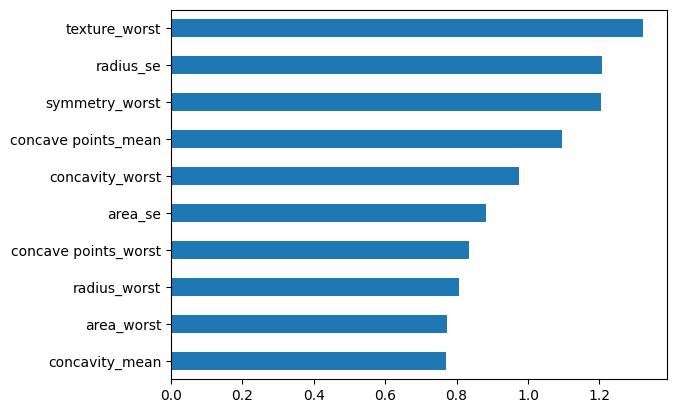

In [ ]:
weights = pd.Series(model.coef_[0],
                    index=X.columns.values) 
print(weights.sort_values(ascending=True)[-10:].plot(kind='barh', title='Top 10 Positive Feature Weights'))

AxesSubplot(0.125,0.11;0.775x0.77)


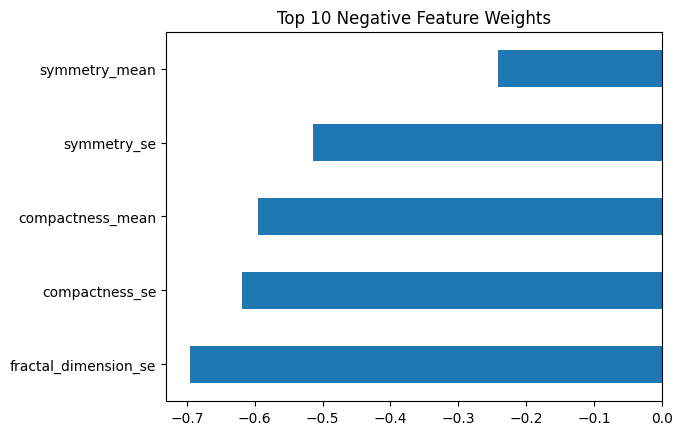

In [71]:
weights = pd.Series(model.coef_[0],
                    index=X.columns.values) 
print(weights.sort_values(ascending=True)[:5].plot(kind='barh', title='Top 10 Negative Feature Weights', ))